# Adult Income Prediction

**Data Set Information:**

This dataset was obtained from UCI Machine Learning Repository. The aim of this problem is to classify adults in two different groups based on their income where group 1 has an income less than USD 50k and group 2 has an income of more than or equal to USD 50k. The data available at hand comes from Census 1994.


**Attribute Information:**

Age: Describes the age of individuals. Continuous.

Workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.

fnlwgt: Continuous.

education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.

education-num: Number of years spent in education. Continuous.

marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.

occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.

relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.

race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.

sex: Female, Male.

capital-gain: Continuous.

capital-loss: Continuous.

hours-per-week: Continuous.

native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.

salary: >50K,<=50K

# Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf

from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()


%matplotlib inline
plt.rcParams['figure.figsize'] = 10, 6


from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, recall_score, accuracy_score, precision_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
from sklearn.metrics import RocCurveDisplay, PrecisionRecallDisplay, roc_auc_score, auc
from sklearn.metrics import roc_curve, average_precision_score, precision_recall_curve
from sklearn.preprocessing import  LabelEncoder


import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

# Exploratory Data Analysis and Visualization

In [116]:
df = pd.read_csv("adult.csv") 

In [117]:
df.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [4]:
def summary(df, pred=None):
    obs = df.shape[0]
    Types = df.dtypes
    Counts = df.apply(lambda x: x.count())
    Min = df.min()
    Max = df.max()
    Uniques = df.apply(lambda x: x.unique().shape[0])
    Nulls = df.apply(lambda x: x.isnull().sum())
    print('Data shape:', df.shape)

    if pred is None:
        cols = ['Types', 'Counts', 'Uniques', 'Nulls', 'Min', 'Max']
        str = pd.concat([Types, Counts, Uniques, Nulls, Min, Max], axis = 1, sort=True)

    str.columns = cols
    print('___________________________\nData Types:')
    print(str.Types.value_counts())
    print('___________________________')
    return str

summary(df)

Data shape: (32561, 15)
___________________________
Data Types:
Types
object    9
int64     6
Name: count, dtype: int64
___________________________


,Types,Counts,Uniques,Nulls,Min,Max
age,int64,32561,73,0,17,90
capital.gain,int64,32561,119,0,0,99999
capital.loss,int64,32561,92,0,0,4356
education,object,32561,16,0,10th,Some-college
education.num,int64,32561,16,0,1,16
fnlwgt,int64,32561,21648,0,12285,1484705
hours.per.week,int64,32561,94,0,1,99
income,object,32561,2,0,<=50K,>50K
marital.status,object,32561,7,0,Divorced,Widowed
native.country,object,32561,42,0,?,Yugoslavia


In [5]:
def duplicate_values(df):
    print("Duplicate check...")
    num_duplicates = df.duplicated(subset=None, keep='first').sum()
    if num_duplicates > 0:
        print("There are", num_duplicates, "duplicated observations in the dataset.")
        df.drop_duplicates(keep='first', inplace=True)
        print(num_duplicates, "duplicates were dropped!")
        print('*' * 100)
    else:
        print("There are no duplicated observations in the dataset.")

In [6]:
duplicate_values(df)

Duplicate check...
There are 24 duplicated observations in the dataset.
24 duplicates were dropped!
****************************************************************************************************


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,32537.0,38.585549,13.637984,17.0,28.0,37.0,48.0,90.0
fnlwgt,32537.0,189780.848511,105556.471009,12285.0,117827.0,178356.0,236993.0,1484705.0
education.num,32537.0,10.081815,2.571633,1.0,9.0,10.0,12.0,16.0
capital.gain,32537.0,1078.443741,7387.957424,0.0,0.0,0.0,0.0,99999.0
capital.loss,32537.0,87.368227,403.101833,0.0,0.0,0.0,0.0,4356.0
hours.per.week,32537.0,40.440329,12.346889,1.0,40.0,40.0,45.0,99.0


In [8]:
df.describe(include="object").T

,count,unique,top,freq
workclass,32537,9,Private,22673
education,32537,16,HS-grad,10494
marital.status,32537,7,Married-civ-spouse,14970
occupation,32537,15,Prof-specialty,4136
relationship,32537,6,Husband,13187
race,32537,5,White,27795
sex,32537,2,Male,21775
native.country,32537,42,United-States,29153
income,32537,2,<=50K,24698


## Missing Value Control 

In [9]:
def missing_values(df):
    missing_number = df.isnull().sum().sort_values(ascending = False)
    missing_percent = (df.isnull().sum() / df.isnull().count()).sort_values(ascending = False)
    missing_values = pd.concat([missing_number, missing_percent], axis = 1, keys = ['Missing_Number', 'Missing_Percent'])
    return missing_values[missing_values['Missing_Number'] > 0]

In [10]:
missing_values(df)

,Missing_Number,Missing_Percent


In [11]:
df.replace(to_replace='?',value=np.nan,inplace=True)

#df=df.applymap(lambda x: np.nan if x=='?' else x)

In [12]:
missing_values(df)

,Missing_Number,Missing_Percent
occupation,1843,0.056643
workclass,1836,0.056428
native.country,582,0.017887


### workclass 

In [13]:
df['workclass'].value_counts(normalize=True)

workclass
Private             0.738510
Self-emp-not-inc    0.082733
Local-gov           0.068174
State-gov           0.042279
Self-emp-inc        0.036351
Federal-gov         0.031269
Without-pay         0.000456
Never-worked        0.000228
Name: proportion, dtype: float64

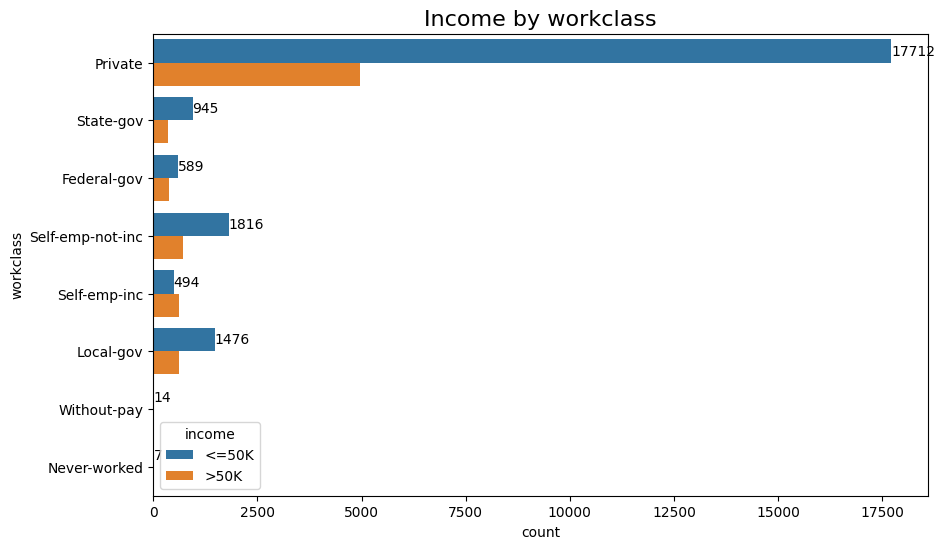

In [14]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['workclass'], hue = df['income'])
plt.title("Income by workclass", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [15]:
df['workclass'] = df['workclass'].fillna('Private')

In [16]:
missing_values(df)

,Missing_Number,Missing_Percent
occupation,1843,0.056643
native.country,582,0.017887


### occupation

In [17]:
df['occupation'].value_counts(normalize=True)

occupation
Prof-specialty       0.134749
Craft-repair         0.133381
Exec-managerial      0.132436
Adm-clerical         0.122760
Sales                0.118916
Other-service        0.107220
Machine-op-inspct    0.065159
Transport-moving     0.052030
Handlers-cleaners    0.044602
Farming-fishing      0.032319
Tech-support         0.030201
Protective-serv      0.021144
Priv-house-serv      0.004789
Armed-Forces         0.000293
Name: proportion, dtype: float64

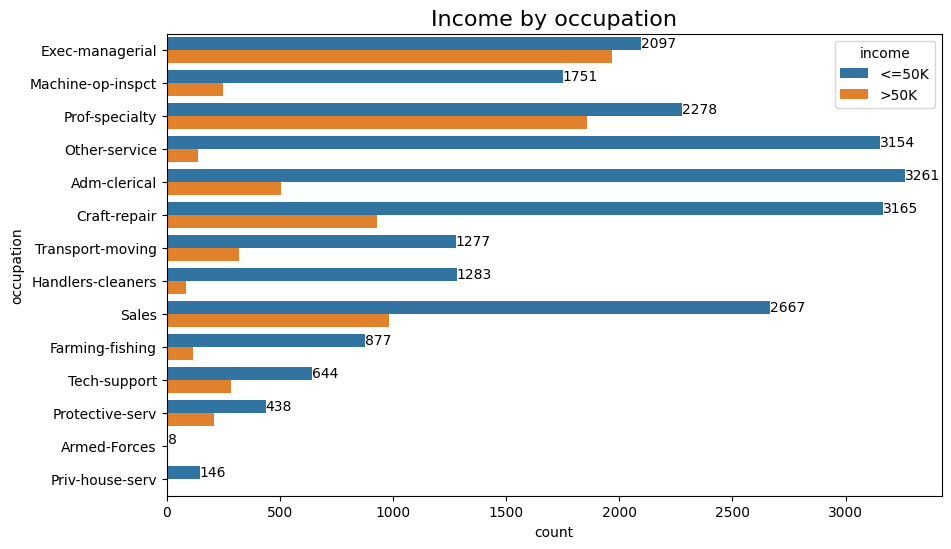

In [18]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['occupation'], hue = df['income'])
plt.title("Income by occupation", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [19]:
df['occupation'] = df['occupation'].fillna(method='bfill')

In [20]:
missing_values(df)

,Missing_Number,Missing_Percent
native.country,582,0.017887


### native country 

In [21]:
df['native.country'].value_counts(normalize=True)

native.country
United-States                 0.912314
Mexico                        0.019997
Philippines                   0.006196
Germany                       0.004287
Canada                        0.003787
Puerto-Rico                   0.003568
El-Salvador                   0.003317
India                         0.003129
Cuba                          0.002973
England                       0.002816
Jamaica                       0.002535
South                         0.002504
China                         0.002347
Italy                         0.002284
Dominican-Republic            0.002191
Vietnam                       0.002097
Guatemala                     0.001940
Japan                         0.001940
Poland                        0.001878
Columbia                      0.001846
Taiwan                        0.001596
Haiti                         0.001377
Iran                          0.001346
Portugal                      0.001158
Nicaragua                     0.001064
Peru      

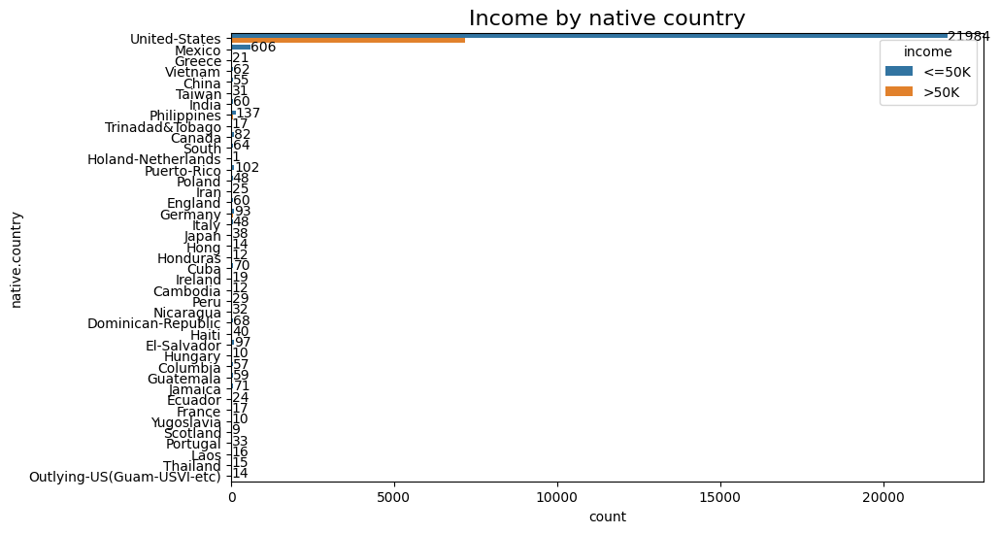

In [22]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['native.country'], hue = df['income'])
plt.title("Income by native country", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [23]:
df['native.country'] = df['native.country'].fillna('United-States')

In [24]:
missing_values(df)

,Missing_Number,Missing_Percent


## Target Variable

In [25]:
def value_cnt(df, column_name):
    vc = df[column_name].value_counts()
    vc_norm = df[column_name].value_counts(normalize=True)

    vc = vc.rename_axis('workclass').reset_index(name='counts')
    vc_norm = vc_norm.rename_axis('workclass').reset_index(name='norm_counts')

    df_result = pd.concat([vc['workclass'], vc['counts'], vc_norm['norm_counts']], axis=1)
    
    return df_result

In [26]:
print(df.income.value_counts())
print("---------------------")
print(df.income.value_counts(normalize=True))

income
<=50K    24698
>50K      7839
Name: count, dtype: int64
---------------------
income
<=50K    0.759074
>50K     0.240926
Name: proportion, dtype: float64


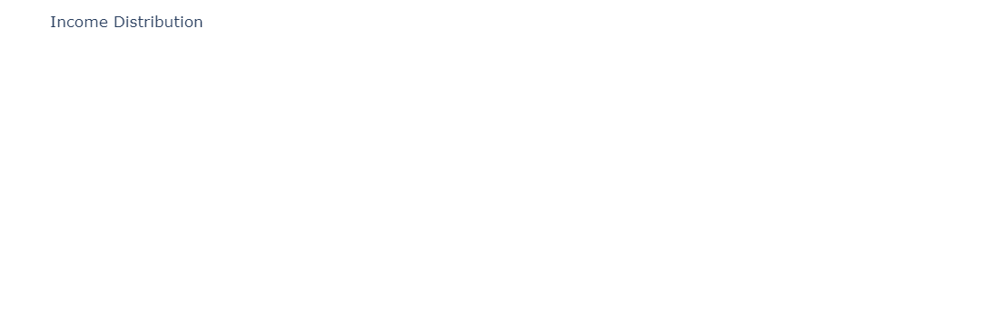

In [77]:
income_distr =df['income'].value_counts().reset_index()
fig = px.pie(income_distr, values='income', names=income_distr.index)
fig.update_layout(title="Income Distribution")
fig.show()

<Axes: >

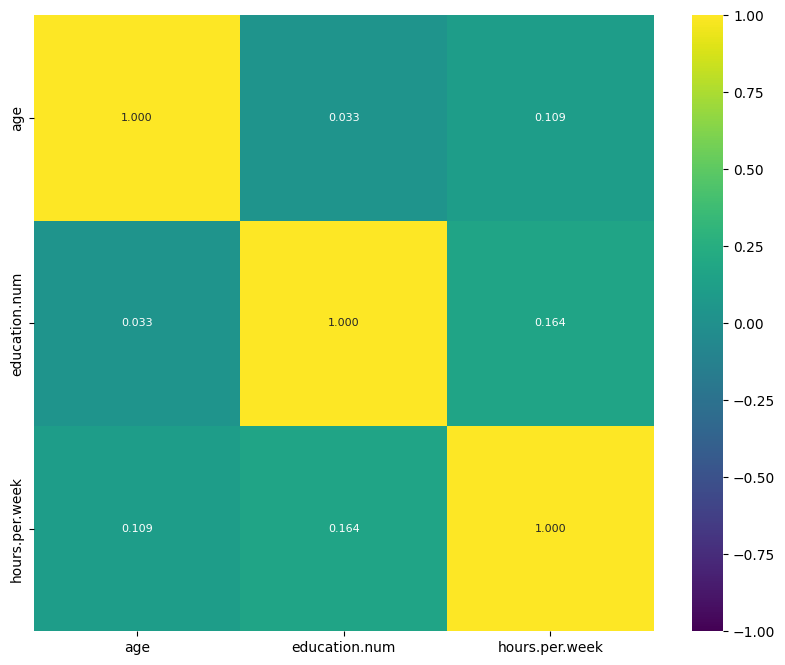

In [80]:
numeric_df = df.select_dtypes(include=['number'])
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_df.corr(), vmin=-1, vmax=1, annot=True, fmt='.3f', cmap='viridis', annot_kws={"size": 8})

In [81]:
df['income']=df['income'].map({'<=50K': 0, '>50K': 1})

In [82]:
df.sample(5)

,age,workclass,education,education.num,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,income,capital_diff
2642,44,Private,Bachelors,13,Married-civ-spouse,Sales,Husband,White,Male,50,United-States,1,High
210,39,Private,Some-college,10,Never-married,Other-service,Own-child,Black,Female,40,United-States,0,Low
27760,26,Private,Some-college,10,Never-married,Farming-fishing,Other-relative,White,Female,65,United-States,0,Low
2238,68,Self-emp-inc,Some-college,10,Married-civ-spouse,Exec-managerial,Husband,White,Male,20,United-States,1,High
743,57,Private,HS-grad,9,Married-civ-spouse,Transport-moving,Husband,White,Male,40,United-States,1,Low


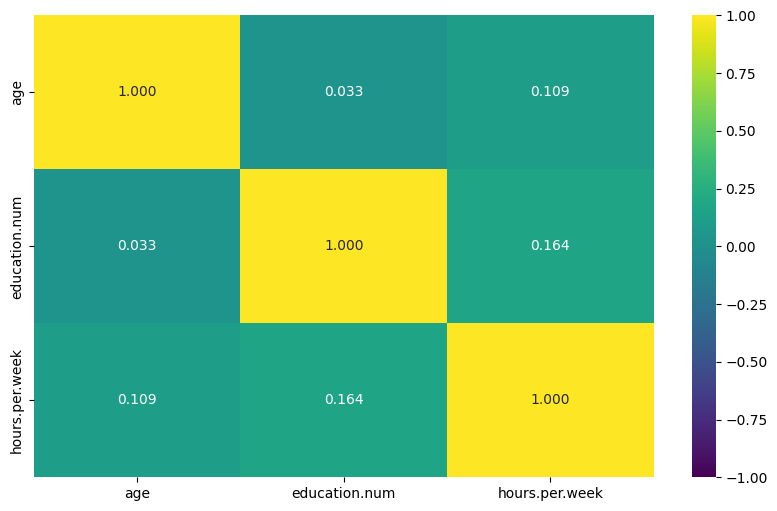

In [86]:
sns.heatmap(numeric_df.corr(),vmin=-1,vmax=1, annot=True, fmt='.3f', cmap='viridis');

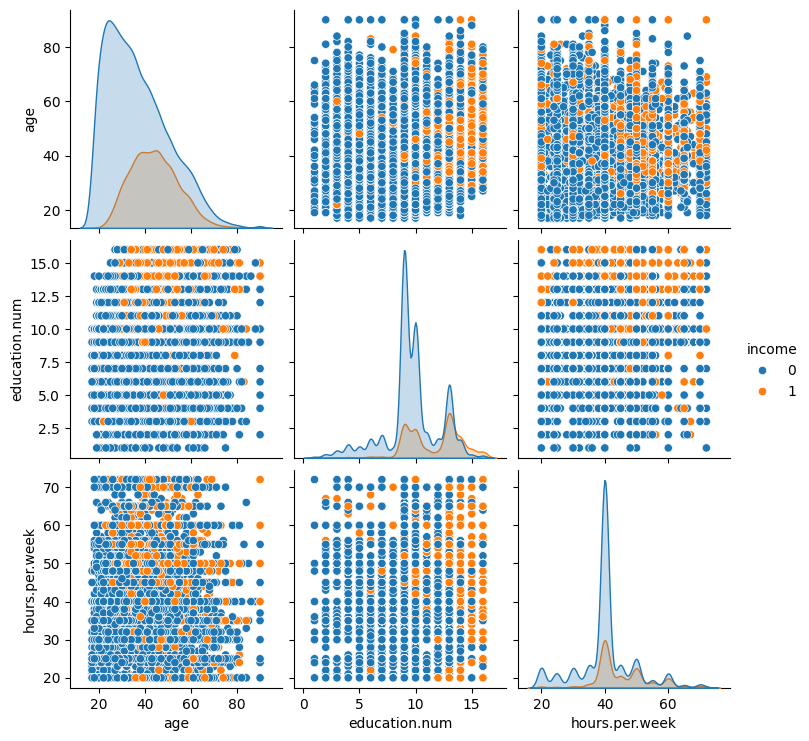

In [84]:
sns.pairplot(df, hue = "income");

## Age

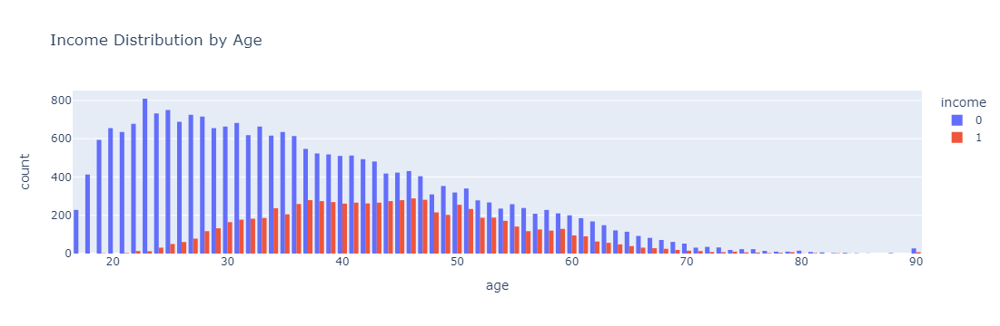

In [87]:
px.histogram(df, x='age', color="income", barmode='group', title='Income Distribution by Age')

<Axes: xlabel='income', ylabel='age'>

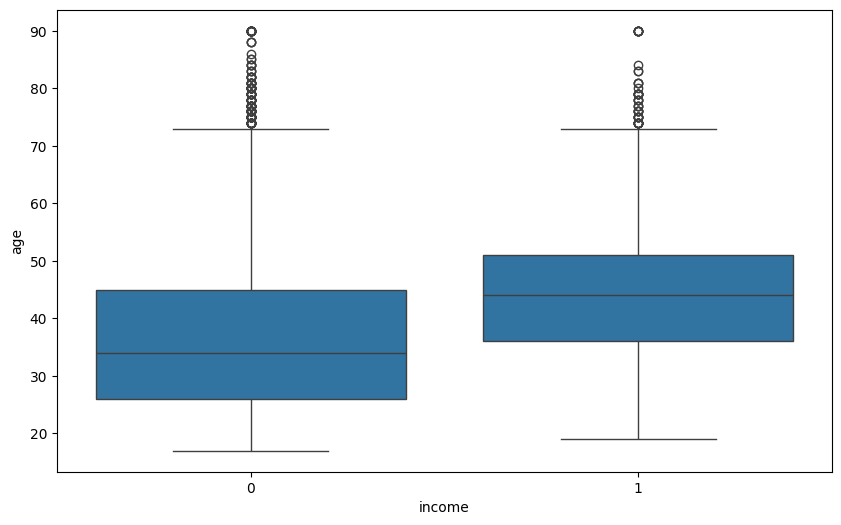

In [88]:
 sns.boxplot(data=df,y="age",x='income');

## Work Class 

In [89]:
value_cnt(df, 'workclass')

,workclass,counts,norm_counts
0,Private,22940,0.754357
1,Self-emp-not-inc,2268,0.074581
2,Local-gov,2002,0.065834
3,State-gov,1201,0.039494
4,Self-emp-inc,1050,0.034528
5,Federal-gov,933,0.030681
6,Without-pay,11,0.000362
7,Never-worked,5,0.000164


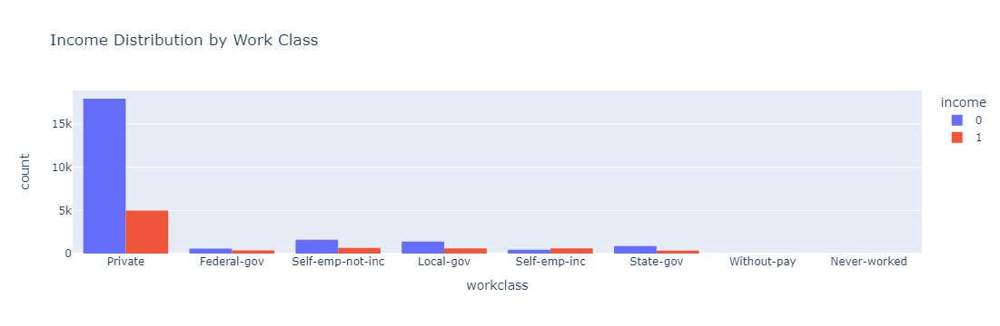

In [90]:
px.histogram(df, x='workclass', color="income", barmode='group', title='Income Distribution by Work Class')

## fnlwgt 

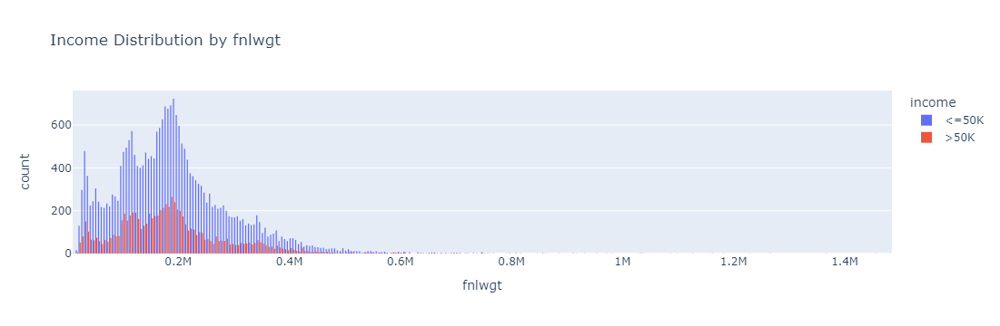

In [120]:
px.histogram(df, x='fnlwgt', color="income", barmode='group', title='Income Distribution by fnlwgt')

In [ ]:
sns.boxplot(data=df,y="fnlwgt",x='income');

In [ ]:
df.drop(['fnlwgt'], axis = 1, inplace = True)

## Education and Education Num

In [92]:
value_cnt(df, 'education')

,workclass,counts,norm_counts
0,HS-grad,9968,0.327787
1,Some-college,6700,0.220322
2,Bachelors,5114,0.168168
3,School,3708,0.121934
4,Masters,1637,0.053831
5,Assoc-voc,1326,0.043604
6,Assoc-acdm,1002,0.032950
7,Prof-school,527,0.017330
8,Doctorate,383,0.012595
9,Preschool,45,0.001480


In [93]:
df['education'].replace(['11th', '9th', '7th-8th', '5th-6th', '10th', '1st-4th', '12th'], ' School', inplace = True)

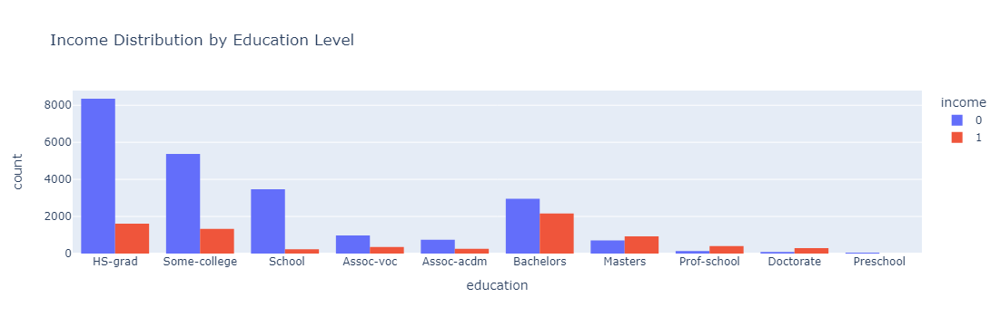

In [94]:
px.histogram(df, x='education', color=df.income, barmode='group', title='Income Distribution by Education Level')

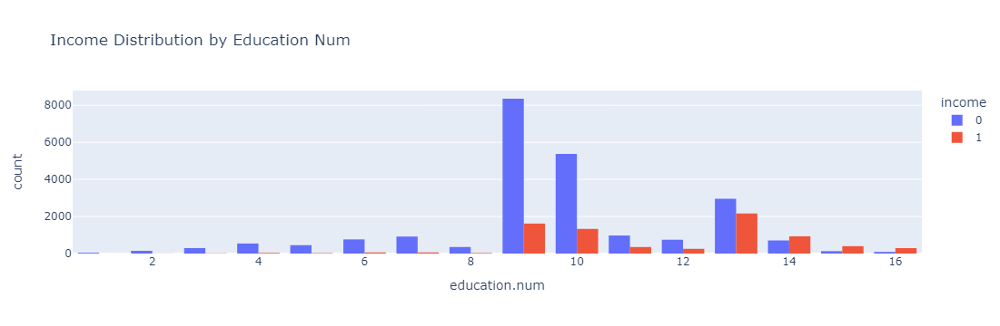

In [95]:
px.histogram(df, x='education.num', color="income", barmode='group', title='Income Distribution by Education Num')

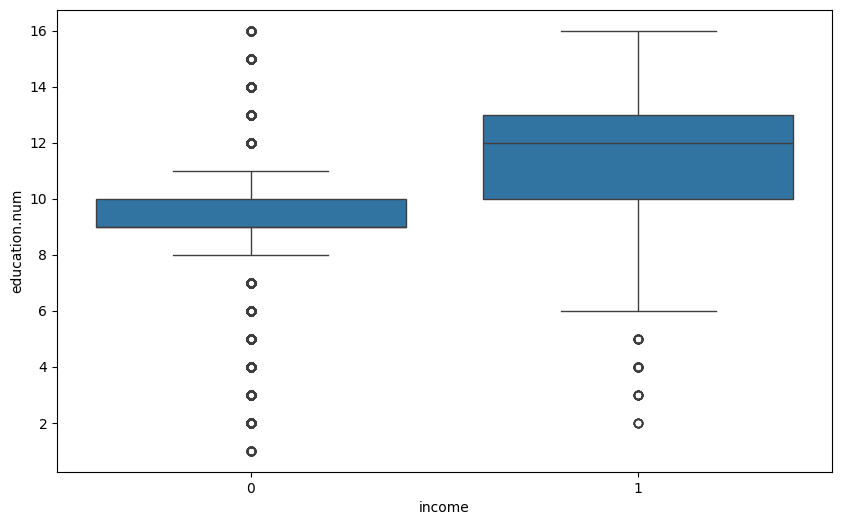

In [96]:
sns.boxplot(data=df,y="education.num",x='income');

## Marital Status

In [97]:
value_cnt(df, 'marital.status')

,workclass,counts,norm_counts
0,Married-civ-spouse,14255,0.468760
1,Never-married,9677,0.318218
2,Divorced,4264,0.140217
3,Separated,983,0.032325
4,Widowed,817,0.026866
5,Married-spouse-absent,396,0.013022
6,Married-AF-spouse,18,0.000592


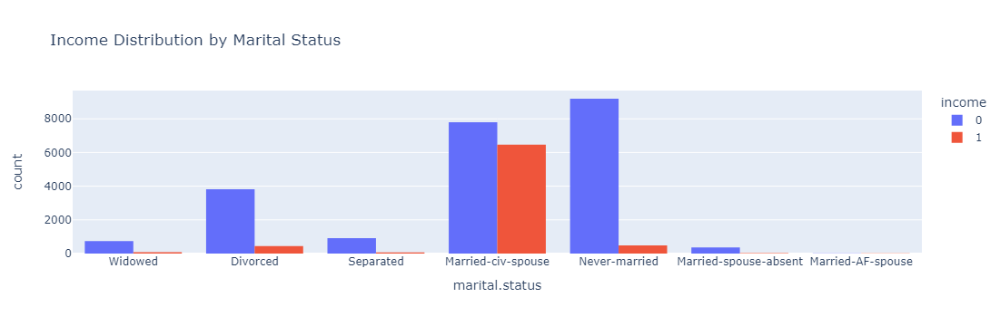

In [98]:
px.histogram(df, x='marital.status', color="income", barmode='group', title='Income Distribution by Marital Status')

## Occupation

In [99]:
value_cnt(df, 'occupation')

,workclass,counts,norm_counts
0,Craft-repair,4191,0.137817
1,Prof-specialty,4102,0.134890
2,Exec-managerial,4085,0.134331
3,Adm-clerical,3738,0.122920
4,Sales,3569,0.117363
5,Other-service,3083,0.101381
6,Machine-op-inspct,2056,0.067609
7,Transport-moving,1592,0.052351
8,Handlers-cleaners,1350,0.044393
9,Farming-fishing,949,0.031207


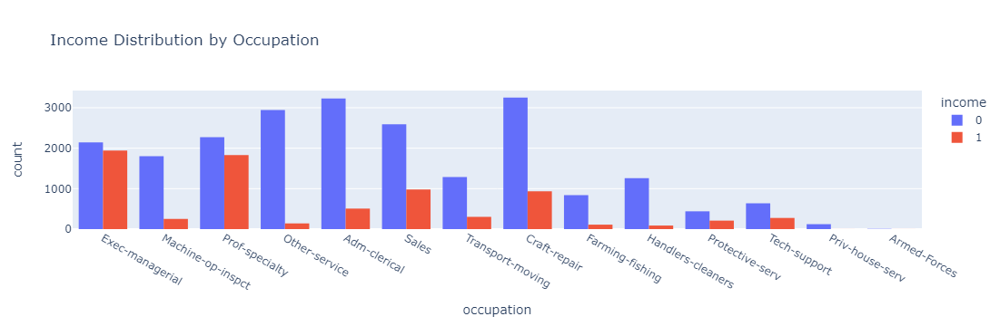

In [100]:
px.histogram(df, x='occupation', color="income", barmode='group', title='Income Distribution by Occupation')

## Relationship

In [101]:
value_cnt(df, 'relationship')

,workclass,counts,norm_counts
0,Husband,12614,0.414798
1,Not-in-family,7823,0.257251
2,Own-child,4333,0.142486
3,Unmarried,3293,0.108287
4,Wife,1439,0.047320
5,Other-relative,908,0.029859


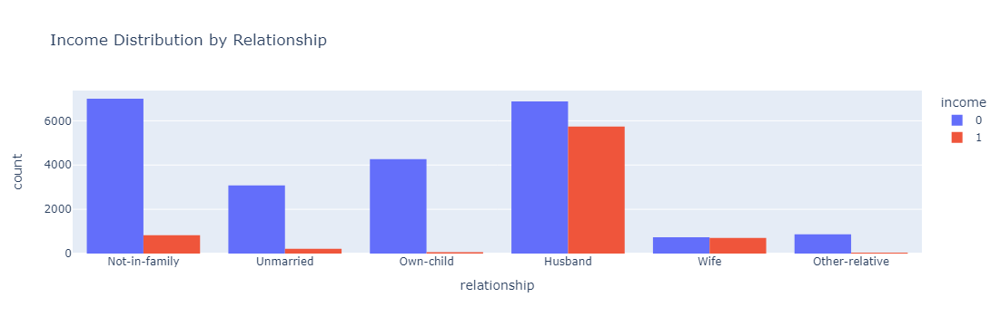

In [102]:
px.histogram(df, x='relationship', color="income", barmode='group', title='Income Distribution by Relationship')

## Race

In [103]:
value_cnt(df, 'race')

,workclass,counts,norm_counts
0,White,25913,0.852121
1,Black,2974,0.097797
2,Others,1523,0.050082


In [104]:
df['race'].replace(['Asian-Pac-Islander', 'Amer-Indian-Eskimo', 'Other'],' Others', inplace = True)

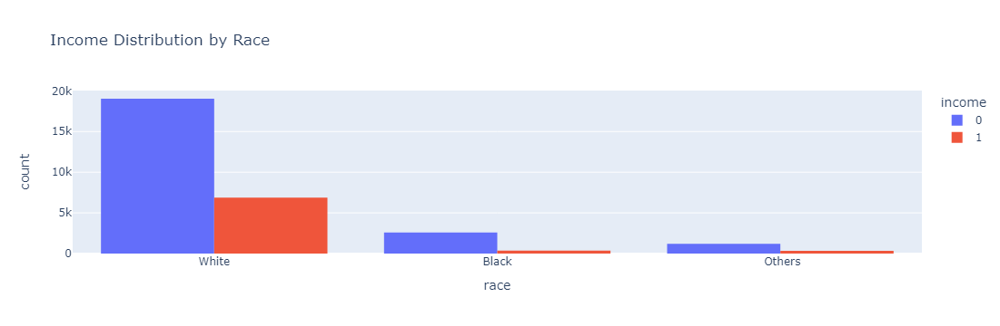

In [105]:
px.histogram(df, x='race', color="income", barmode='group', title='Income Distribution by Race')

## Sex

In [106]:
value_cnt(df, 'sex')

,workclass,counts,norm_counts
0,Male,20620,0.678066
1,Female,9790,0.321934


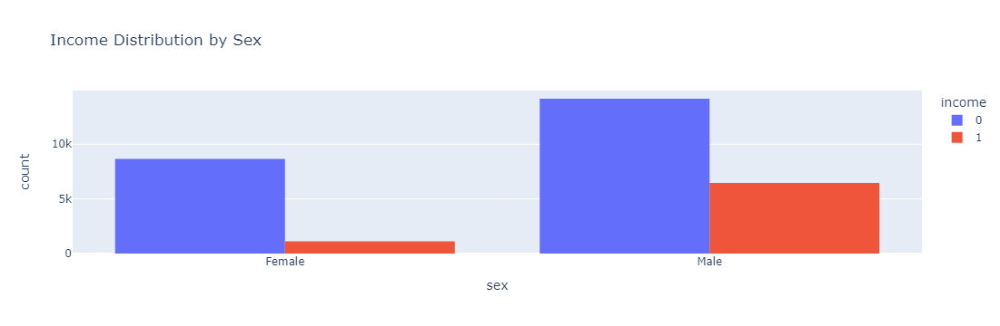

In [107]:
px.histogram(df, x='sex', color="income", barmode='group', title='Income Distribution by Sex')

In [111]:
df.head()

,age,workclass,education,education.num,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,income,capital_diff
0,90,Private,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,40,United-States,0,Low
2,66,Private,Some-college,10,Widowed,Machine-op-inspct,Unmarried,Black,Female,40,United-States,0,Low
3,54,Private,School,4,Divorced,Machine-op-inspct,Unmarried,White,Female,40,United-States,0,Low
4,41,Private,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,40,United-States,0,Low
5,34,Private,HS-grad,9,Divorced,Other-service,Unmarried,White,Female,45,United-States,0,Low


## Capital Gain and Loss

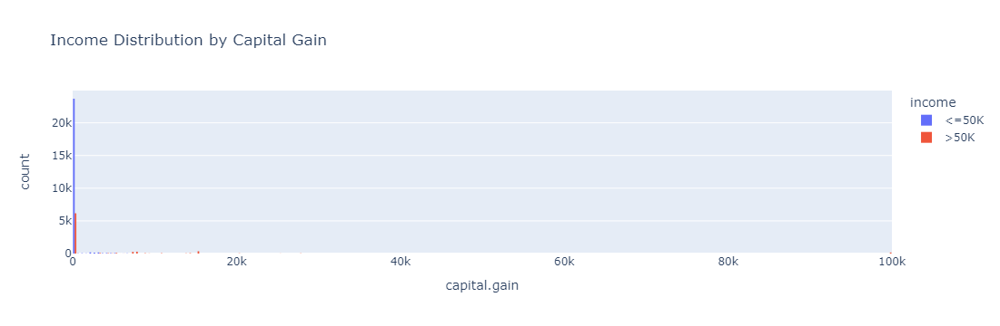

In [119]:
px.histogram(df, x='capital.gain', color="income", barmode='group', title='Income Distribution by Capital Gain')
#px.histogram(df, x='capital.gain', color="income", barmode='group', title='Income Distribution by Capital Gain')
#px.histogram(df, x=df['capital.gain'], color="income", barmode='group', title='Income Distribution by Capital Gain')


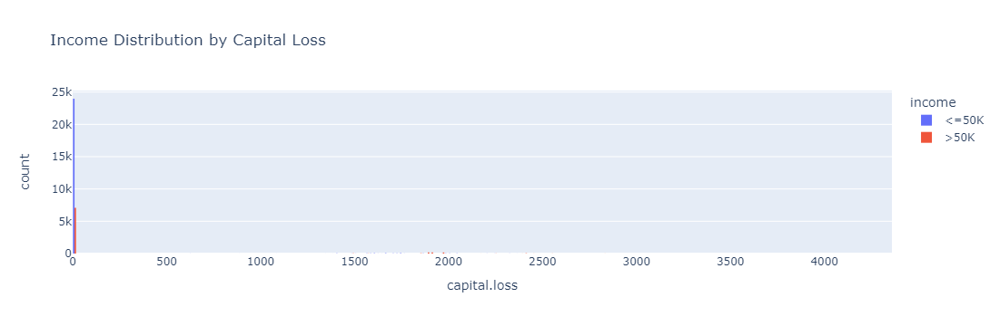

In [121]:
px.histogram(df, x='capital.loss', color="income", barmode='group', title='Income Distribution by Capital Loss')

In [122]:
df['capital_diff'] = df['capital.gain'] - df['capital.loss']
df['capital_diff'] = pd.cut(df['capital_diff'], bins = [-5000, 5000, 100000], labels = ['Low', 'High'])
df['capital_diff'] = df['capital_diff'].astype('object')
df.drop(['capital.gain'], axis = 1, inplace = True)
df.drop(['capital.loss'], axis = 1, inplace = True)

'Capital Diff' sütununu iki kategoriye böler ('Minor' ve 'Major'). 

'Capital Diff' sütunundaki değerler, belirtilen sınırlar arasında kesilerek (cut) kategorilere ayrılır. 

Bu sınırlar, bins parametresi ile belirtilir. 

-5000 ve 5000 sınırları arasındaki değerler 'Minor' kategorisine atanırken, 5000 ve 100000 sınırları arasındaki değerler 'Major' kategorisine atanır.

In [123]:
value_cnt(df, 'capital_diff')

,workclass,counts,norm_counts
0,Low,30913,0.949387
1,High,1648,0.050613


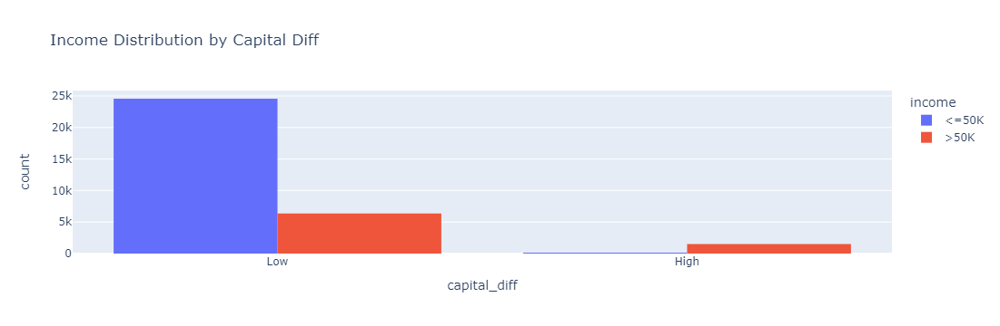

In [124]:
px.histogram(df, x='capital_diff', color="income", barmode='group', title='Income Distribution by Capital Diff')

## Hours per Week

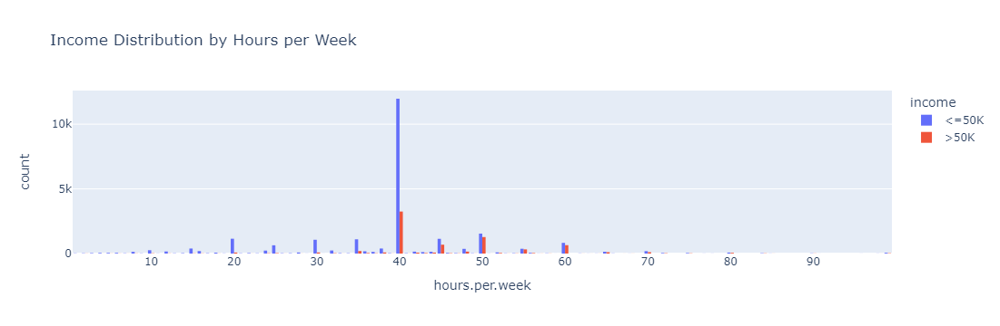

In [125]:
px.histogram(df, x='hours.per.week', color="income", barmode='group', title='Income Distribution by Hours per Week')

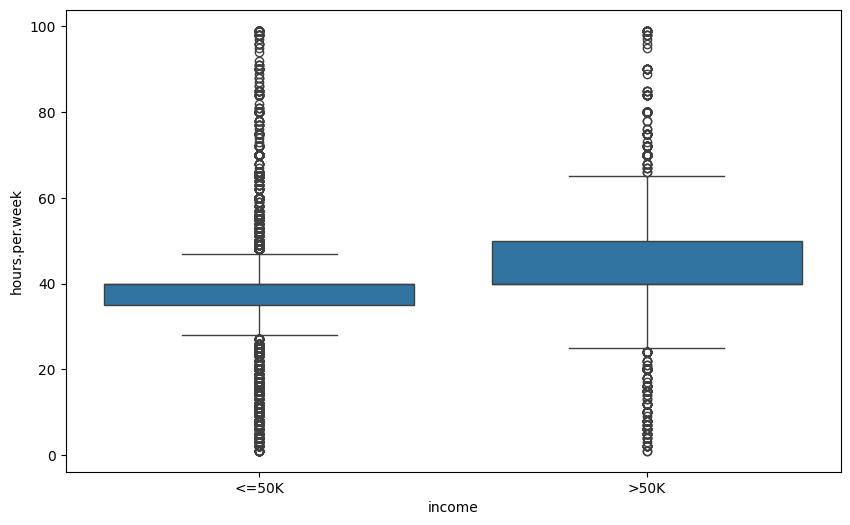

In [126]:
sns.boxplot(data=df,y="hours.per.week",x='income');

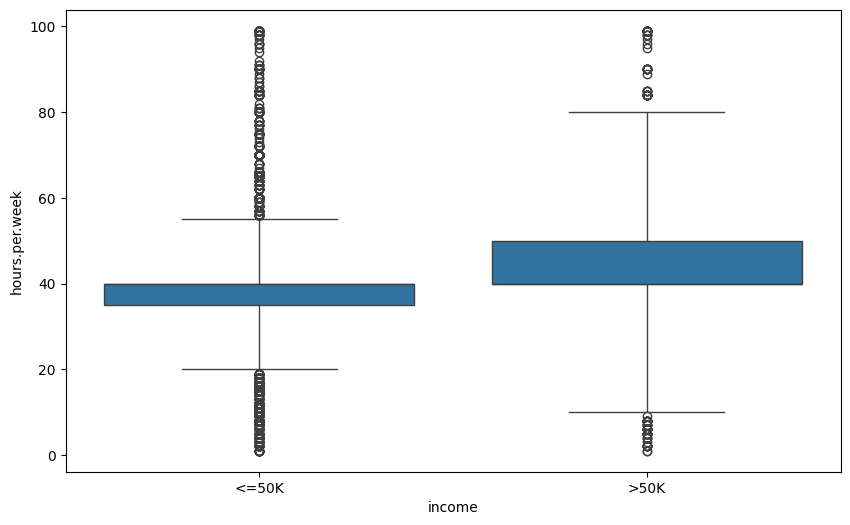

In [127]:
sns.boxplot(data=df,y="hours.per.week",x='income', whis=3);

In [128]:
len(df[df["hours.per.week"]>72])  

427

In [129]:
len(df[df["hours.per.week"]<20])  

1704

In [130]:
len(df[(df["hours.per.week"] > 72) | (df["hours.per.week"] < 20)])

2131

In [131]:
df = df[~((df["hours.per.week"] > 72) | (df["hours.per.week"] < 20))]

In [132]:
df.shape

(30430, 14)

## Native Country

In [133]:
value_cnt(df, 'native.country')

,workclass,counts,norm_counts
0,United-States,27228,0.894775
1,Mexico,617,0.020276
2,?,548,0.018009
3,Philippines,186,0.006112
4,Germany,127,0.004174
5,Canada,113,0.003713
6,Puerto-Rico,109,0.003582
7,El-Salvador,100,0.003286
8,India,95,0.003122
9,Cuba,90,0.002958


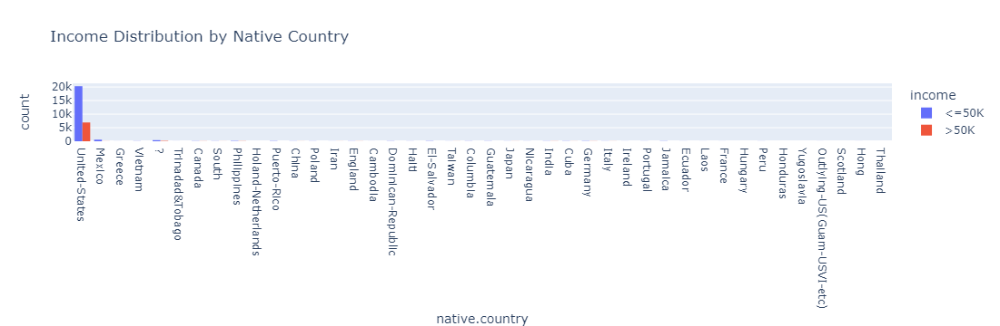

In [134]:
px.histogram(df, x='native.country', color="income", barmode='group', title='Income Distribution by Native Country')

In [135]:
df['native.country'].loc[df['native.country'] != 'United-States'] = 'Others'

In [136]:
value_cnt(df, 'native.country')

,workclass,counts,norm_counts
0,United-States,27228,0.894775
1,Others,3202,0.105225


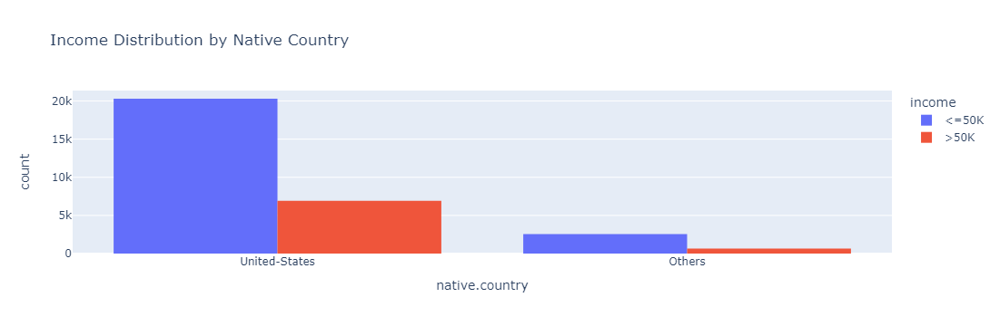

In [137]:
px.histogram(df, x='native.country', color="income", barmode='group', title='Income Distribution by Native Country')

In [138]:
df1 = df.copy()

# Data Pre-Processing

## Train | Test Split

In [139]:
X= df.drop(columns="income")
y= df.income

In [140]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=101)

In [141]:
categorical = ['workclass', 'marital.status', 'occupation', 'relationship', 'race', 'sex', 'native.country','education', 'capital_diff']
label_encoder = LabelEncoder()

for feature in categorical:
        X_train[feature] = label_encoder.fit_transform(X_train[feature])
        X_test[feature] = label_encoder.transform(X_test[feature])

# Implement Logistic Regression

In [142]:
operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression())]

log_pipe = Pipeline(steps=operations)

log_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic', LogisticRegression())])

In [143]:
y_pred = log_pipe.predict(X_test)
y_pred

array(['<=50K', '<=50K', '<=50K', ..., '>50K', '<=50K', '<=50K'],
      dtype=object)

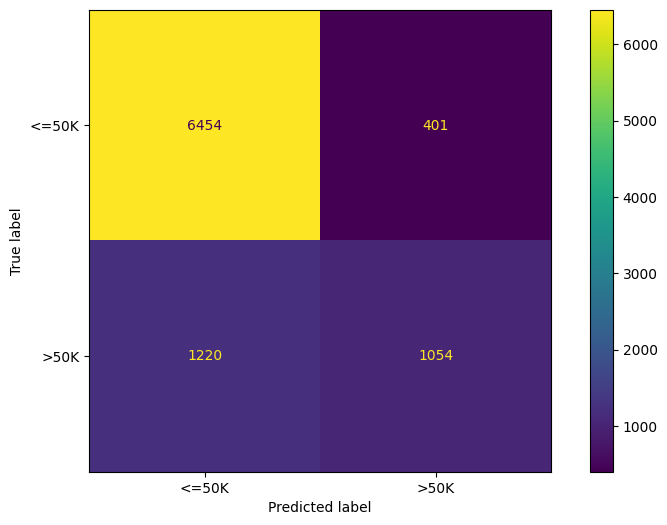

In [144]:
ConfusionMatrixDisplay.from_estimator(log_pipe, X_test, y_test)

def eval_metric(model, X_train, y_train, X_test, y_test):

    """ to get the metrics for the model """

    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [145]:
eval_metric(log_pipe, X_train, y_train, X_test, y_test) 

Test_Set
[[6454  401]
 [1220 1054]]
              precision    recall  f1-score   support

       <=50K       0.84      0.94      0.89      6855
        >50K       0.72      0.46      0.57      2274

    accuracy                           0.82      9129
   macro avg       0.78      0.70      0.73      9129
weighted avg       0.81      0.82      0.81      9129


Train_Set
[[15081   915]
 [ 2875  2430]]
              precision    recall  f1-score   support

       <=50K       0.84      0.94      0.89     15996
        >50K       0.73      0.46      0.56      5305

    accuracy                           0.82     21301
   macro avg       0.78      0.70      0.73     21301
weighted avg       0.81      0.82      0.81     21301



### GridSearchCV

In [150]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression())]

log_pipe = Pipeline(steps=operations)

penalty = ["l2"]
C = [0.01, 0.1, 1] 
class_weight= ["balanced", None] 


solver = ["lbfgs", "liblinear"] #"sag", "saga"

param_grid = {"logistic__penalty" : penalty,
              "logistic__C" : C,
              "logistic__class_weight":class_weight,
              "logistic__solver":solver}



cv = StratifiedKFold(n_splits = 10) 

grid_model = GridSearchCV(estimator=log_pipe,
                          param_grid=param_grid,
                          cv=cv,
                          scoring = "recall",   
                          n_jobs = -1,
                          return_train_score=True)

In [151]:
log_pipe.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('logistic', LogisticRegression())],
 'verbose': False,
 'scaler': StandardScaler(),
 'logistic': LogisticRegression(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'logistic__C': 1.0,
 'logistic__class_weight': None,
 'logistic__dual': False,
 'logistic__fit_intercept': True,
 'logistic__intercept_scaling': 1,
 'logistic__l1_ratio': None,
 'logistic__max_iter': 100,
 'logistic__multi_class': 'auto',
 'logistic__n_jobs': None,
 'logistic__penalty': 'l2',
 'logistic__random_state': None,
 'logistic__solver': 'lbfgs',
 'logistic__tol': 0.0001,
 'logistic__verbose': 0,
 'logistic__warm_start': False}

In [152]:
grid_model.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('logistic', LogisticRegression())]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.01, 0.1, 1],
                         'logistic__class_weight': ['balanced', None],
                         'logistic__penalty': ['l2'],
                         'logistic__solver': ['lbfgs', 'liblinear']},
             return_train_score=True, scoring='recall')

In [153]:
grid_model.best_params_

{'logistic__C': 0.01,
 'logistic__class_weight': 'balanced',
 'logistic__penalty': 'l2',
 'logistic__solver': 'lbfgs'}

In [154]:
grid_model.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic',
                 LogisticRegression(C=0.01, class_weight='balanced'))])

In [155]:
grid_model.best_score_

nan

In [156]:
grid_model.best_index_

0

In [157]:
pd.DataFrame(grid_model.cv_results_).loc[1, ["mean_test_score", "mean_train_score"]]


# ilgili df'in best indexinden "mean_test_score" ile "mean_train_score" ları çekilip karşılaştırılırak overfitig,
# underfiting değerlendirilmesi yapılır. 

# GridsearchCV aynı zamanda Cross validation işlemi de yaptığından extradan cross validation yapmamıza gerek yok.

# Burda aldığımız scorelar gridsearchcv içerisine verdiğimiz scoring metricinin scorelarıdır.

mean_test_score     NaN
mean_train_score    NaN
Name: 1, dtype: object

In [158]:
eval_metric(grid_model, X_train, y_train, X_test, y_test)  

Test_Set
[[5248 1607]
 [ 538 1736]]
              precision    recall  f1-score   support

       <=50K       0.91      0.77      0.83      6855
        >50K       0.52      0.76      0.62      2274

    accuracy                           0.77      9129
   macro avg       0.71      0.76      0.72      9129
weighted avg       0.81      0.77      0.78      9129


Train_Set
[[12293  3703]
 [ 1229  4076]]
              precision    recall  f1-score   support

       <=50K       0.91      0.77      0.83     15996
        >50K       0.52      0.77      0.62      5305

    accuracy                           0.77     21301
   macro avg       0.72      0.77      0.73     21301
weighted avg       0.81      0.77      0.78     21301



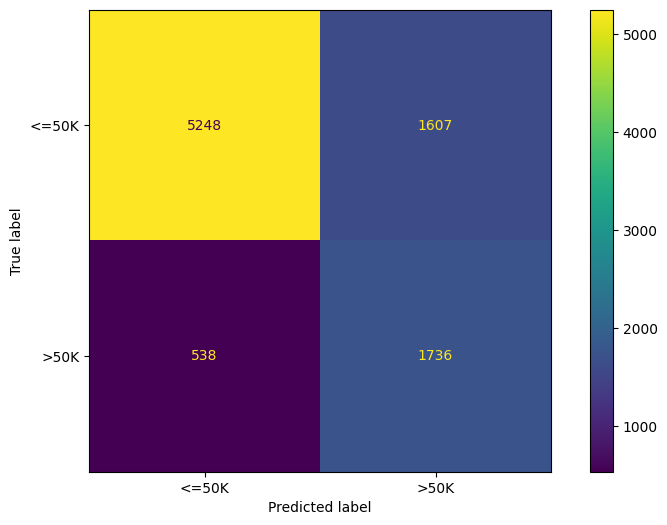

In [159]:
ConfusionMatrixDisplay.from_estimator(grid_model, X_test, y_test)

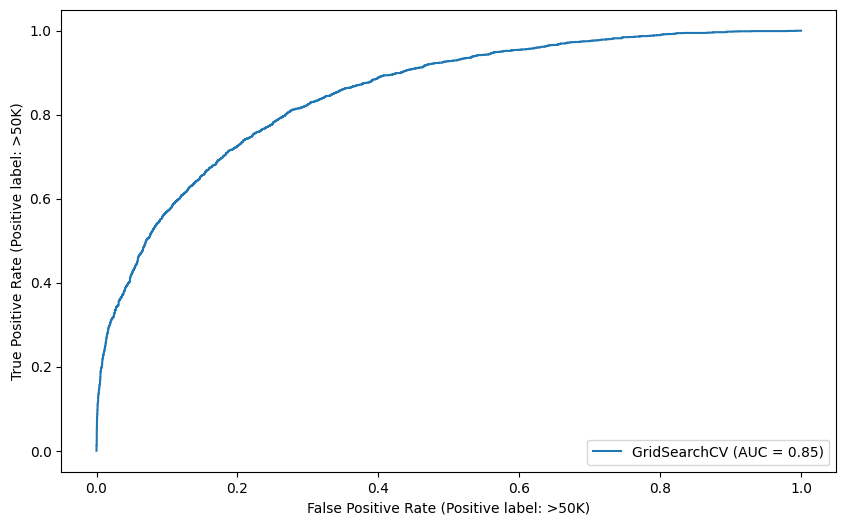

In [160]:
RocCurveDisplay.from_estimator(grid_model, X_test, y_test);  ##Use in Balance Data 

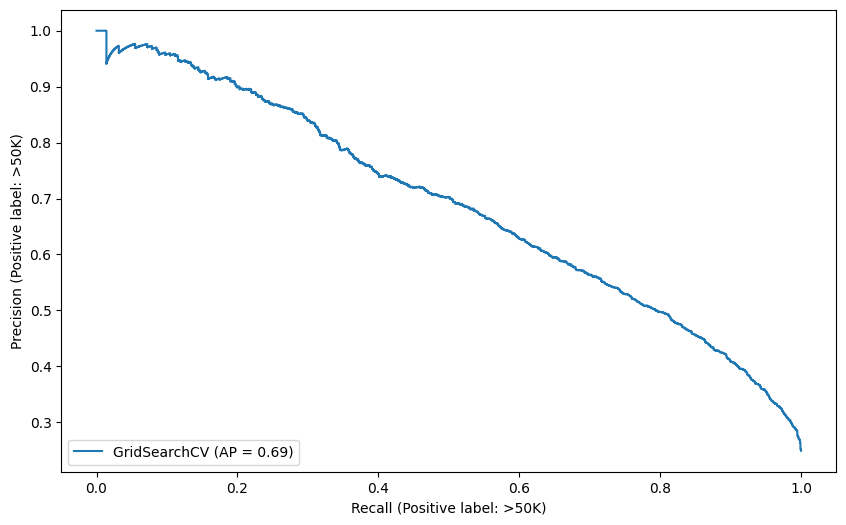

In [161]:
PrecisionRecallDisplay.from_estimator(grid_model, X_test, y_test);  ##Unbalance Dataset

# Implement K Nearest Neigbors (KNN)

In [162]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier())]

knn_pipe = Pipeline(steps=operations)

knn_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('knn', KNeighborsClassifier())])

In [163]:
y_pred = knn_pipe.predict(X_test)
y_pred

array(['<=50K', '<=50K', '<=50K', ..., '>50K', '>50K', '<=50K'],
      dtype=object)

In [164]:
y_pred_proba = knn_pipe.predict_proba(X_test)

In [165]:
pd.DataFrame(y_pred_proba)

,0,1
0,1.0,0.0
1,1.0,0.0
2,1.0,0.0
3,0.2,0.8
4,1.0,0.0
...,...,...
9124,0.6,0.4
9125,0.4,0.6
9126,0.0,1.0
9127,0.4,0.6


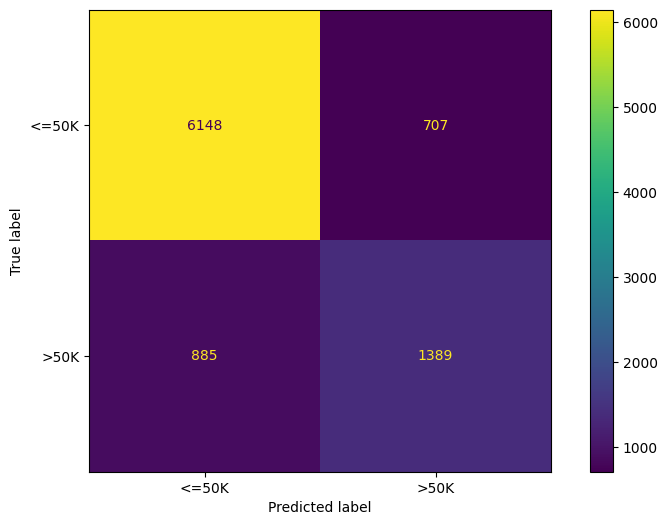

In [166]:
ConfusionMatrixDisplay.from_estimator(knn_pipe, X_test, y_test);

In [167]:
eval_metric(knn_pipe, X_train, y_train, X_test, y_test)

Test_Set
[[6148  707]
 [ 885 1389]]
              precision    recall  f1-score   support

       <=50K       0.87      0.90      0.89      6855
        >50K       0.66      0.61      0.64      2274

    accuracy                           0.83      9129
   macro avg       0.77      0.75      0.76      9129
weighted avg       0.82      0.83      0.82      9129


Train_Set
[[14897  1099]
 [ 1513  3792]]
              precision    recall  f1-score   support

       <=50K       0.91      0.93      0.92     15996
        >50K       0.78      0.71      0.74      5305

    accuracy                           0.88     21301
   macro avg       0.84      0.82      0.83     21301
weighted avg       0.87      0.88      0.88     21301



## Elbow Method for Choosing Reasonable K Values

In [168]:
test_error_rates = []


for k in range(1,10):
    
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=k))]

    knn_pipe_model = Pipeline(steps=operations)
    
    scores = cross_validate(knn_pipe_model, X_train, y_train, scoring = ['recall'], cv = 5)
    
    recall_mean = scores["test_recall"].mean() 
    
    test_error = 1 - recall_mean
    
    test_error_rates.append(test_error)

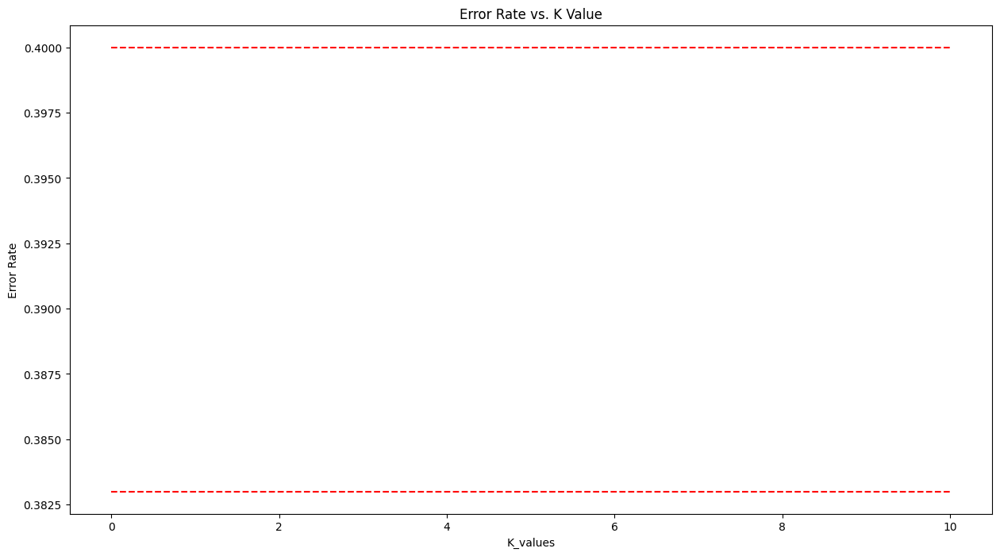

In [169]:
plt.figure(figsize=(15,8))
plt.plot(range(1,10), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y=0.4, xmin = 0, xmax = 10, colors= 'r', linestyles="--")
plt.hlines(y=0.383, xmin = 0, xmax = 10, colors= 'r', linestyles="--")

## Overfiting and underfiting control for k values

In [170]:
test_error_rates = []
train_error_rates = []

for k in range(1,10):
    
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=k))]
    knn_pipe_model = Pipeline(steps=operations)
    
    knn_pipe_model.fit(X_train,y_train) 
    
    scores = cross_validate(knn_pipe_model, X_train, y_train, scoring = ['recall'], cv = 5, return_train_score=True)
    
    recall_test_mean = scores["test_recall"].mean() 
    recall_train_mean = scores["train_recall"].mean() 

    
    test_error = 1 - recall_test_mean
    train_error = 1 - recall_train_mean
    test_error_rates.append(test_error)
    train_error_rates.append(train_error)

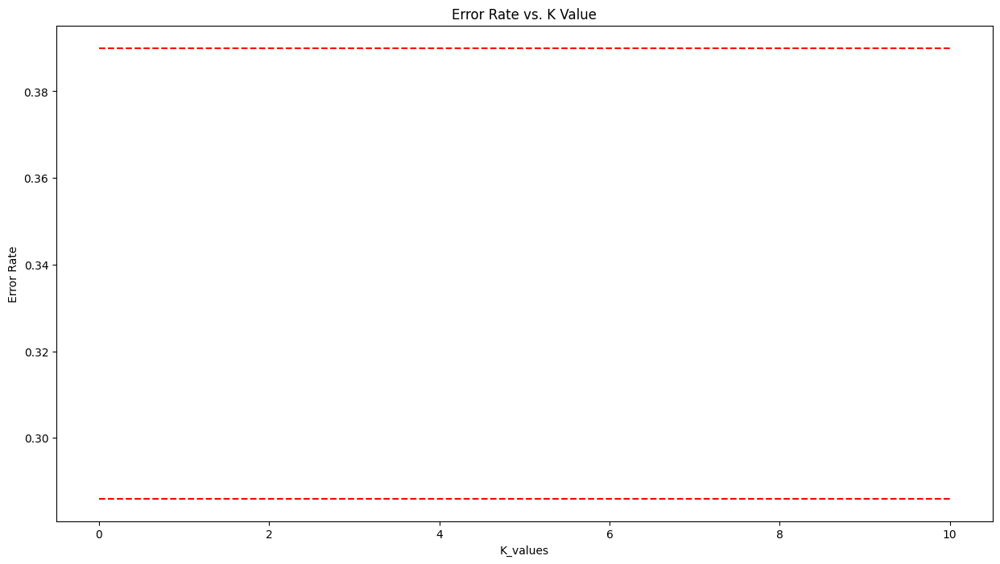

In [171]:
plt.figure(figsize=(15,8))
plt.plot(range(1,10), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)

plt.plot(range(1,10), train_error_rates, color='green', linestyle='--', marker='o',
         markerfacecolor='blue', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y=0.39, xmin = 0, xmax = 10, colors= 'r', linestyles="--")
plt.hlines(y=0.286, xmin = 0, xmax = 10, colors= 'r', linestyles="--")

## Scores by Various K Values

In [172]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=3))]
knn3 = Pipeline(steps=operations)

knn3.fit(X_train, y_train)
print('WITH K=3\n')
eval_metric(knn3, X_train, y_train, X_test, y_test)

WITH K=3

Test_Set
[[6086  769]
 [ 878 1396]]
              precision    recall  f1-score   support

       <=50K       0.87      0.89      0.88      6855
        >50K       0.64      0.61      0.63      2274

    accuracy                           0.82      9129
   macro avg       0.76      0.75      0.75      9129
weighted avg       0.82      0.82      0.82      9129


Train_Set
[[15050   946]
 [ 1228  4077]]
              precision    recall  f1-score   support

       <=50K       0.92      0.94      0.93     15996
        >50K       0.81      0.77      0.79      5305

    accuracy                           0.90     21301
   macro avg       0.87      0.85      0.86     21301
weighted avg       0.90      0.90      0.90     21301



In [173]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=5))]
knn5 = Pipeline(steps=operations)

knn5.fit(X_train, y_train)
print('WITH K=5\n')
eval_metric(knn5, X_train, y_train, X_test, y_test)

WITH K=5

Test_Set
[[6148  707]
 [ 885 1389]]
              precision    recall  f1-score   support

       <=50K       0.87      0.90      0.89      6855
        >50K       0.66      0.61      0.64      2274

    accuracy                           0.83      9129
   macro avg       0.77      0.75      0.76      9129
weighted avg       0.82      0.83      0.82      9129


Train_Set
[[14897  1099]
 [ 1513  3792]]
              precision    recall  f1-score   support

       <=50K       0.91      0.93      0.92     15996
        >50K       0.78      0.71      0.74      5305

    accuracy                           0.88     21301
   macro avg       0.84      0.82      0.83     21301
weighted avg       0.87      0.88      0.88     21301



In [174]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=7))]
knn7 = Pipeline(steps=operations)

knn7.fit(X_train, y_train)
print('WITH K=7\n')
eval_metric(knn7, X_train, y_train, X_test, y_test)

WITH K=7

Test_Set
[[6194  661]
 [ 900 1374]]
              precision    recall  f1-score   support

       <=50K       0.87      0.90      0.89      6855
        >50K       0.68      0.60      0.64      2274

    accuracy                           0.83      9129
   macro avg       0.77      0.75      0.76      9129
weighted avg       0.82      0.83      0.83      9129


Train_Set
[[14849  1147]
 [ 1634  3671]]
              precision    recall  f1-score   support

       <=50K       0.90      0.93      0.91     15996
        >50K       0.76      0.69      0.73      5305

    accuracy                           0.87     21301
   macro avg       0.83      0.81      0.82     21301
weighted avg       0.87      0.87      0.87     21301



## Cross Validate For Optimal K Value

In [175]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=7))]
model = Pipeline(steps=operations)

scores = cross_validate(model, X_train, y_train, scoring = ['accuracy', 'precision','recall',
                                                                   'f1'], cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
1,0.197626,0.982755,0.839043,0.867553,NaN,NaN,NaN,NaN,NaN,NaN
2,0.189697,1.013781,0.829577,0.869230,NaN,NaN,NaN,NaN,NaN,NaN
3,0.184594,1.063359,0.840845,0.867613,NaN,NaN,NaN,NaN,NaN,NaN
4,0.191700,0.937578,0.823944,0.868864,NaN,NaN,NaN,NaN,NaN,NaN
5,0.176577,0.988678,0.838028,0.869751,NaN,NaN,NaN,NaN,NaN,NaN
6,0.170338,0.860778,0.816432,0.870429,NaN,NaN,NaN,NaN,NaN,NaN
7,0.341048,1.053998,0.831455,0.869334,NaN,NaN,NaN,NaN,NaN,NaN
8,0.159635,0.947010,0.820657,0.870325,NaN,NaN,NaN,NaN,NaN,NaN
9,0.199250,1.123847,0.839906,0.868291,NaN,NaN,NaN,NaN,NaN,NaN
10,0.261394,1.171984,0.836150,0.868030,NaN,NaN,NaN,NaN,NaN,NaN


In [176]:
df_scores.mean()[2:]

test_accuracy      0.831604
train_accuracy     0.868942
test_precision          NaN
train_precision         NaN
test_recall             NaN
train_recall            NaN
test_f1                 NaN
train_f1                NaN
dtype: float64

## Gridsearch Method for Choosing Reasonable K Values

In [177]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier())]
knn_model = Pipeline(steps=operations)

In [178]:
knn_model.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('knn', KNeighborsClassifier())],
 'verbose': False,
 'scaler': StandardScaler(),
 'knn': KNeighborsClassifier(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'knn__algorithm': 'auto',
 'knn__leaf_size': 30,
 'knn__metric': 'minkowski',
 'knn__metric_params': None,
 'knn__n_jobs': None,
 'knn__n_neighbors': 5,
 'knn__p': 2,
 'knn__weights': 'uniform'}

In [179]:
k_values= range(1,10)

In [180]:
param_grid = {"knn__n_neighbors":k_values, "knn__p": [1,2], "knn__weights": ['uniform', "distance"]}

In [181]:
knn_grid_model = GridSearchCV(knn_model, param_grid, cv=5, scoring = "recall", return_train_score=True, n_jobs=-1)

In [182]:
knn_grid_model.fit(X_train, y_train)

KeyboardInterrupt: 

In [ ]:
knn_grid_model.best_params_

In [ ]:
knn_grid_model.best_estimator_

In [ ]:
knn_grid_model.best_index_

In [ ]:
pd.DataFrame(knn_grid_model.cv_results_).loc[32, ["mean_test_score", "mean_train_score"]]

In [ ]:
knn_grid_model.best_score_

In [ ]:
ConfusionMatrixDisplay.from_estimator(knn_grid_model, X_test, y_test)

In [ ]:
print('WITH K=9\n')
eval_metric(knn_grid_model, X_train, y_train, X_test, y_test)

In [ ]:
RocCurveDisplay.from_estimator(knn_grid_model, X_test, y_test)

In [ ]:
y_pred_proba = knn_grid_model.predict_proba(X_test)
roc_auc_score(y_test, y_pred_proba[:,1])

In [ ]:
PrecisionRecallDisplay.from_estimator(knn_grid_model, X_test, y_test);

# Implement Decision Tree

In [ ]:
dt_model = DecisionTreeClassifier(random_state=101)

In [ ]:
dt_model.fit(X_train, y_train)

In [ ]:
y_pred = dt_model.predict(X_test)
y_train_pred = dt_model.predict(X_train)

In [ ]:
ConfusionMatrixDisplay.from_estimator(dt_model,X_test,y_test)

In [ ]:
from yellowbrick.classifier import ClassPredictionError

visualizer = ClassPredictionError(dt_model)

# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)

# Evaluate the model on the test data
visualizer.score(X_test, y_test)

# Draw visualization
visualizer.poof();

In [ ]:
eval_metric(dt_model, X_train, y_train, X_test, y_test)

In [ ]:
scores = cross_validate(dt_model, X_train, y_train, scoring = ["accuracy", "precision_micro", "recall_micro", "f1_micro"], 
                        cv = 10, return_train_score=True)

df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

In [ ]:
df_scores.mean()[2:]

In [ ]:
def report_model(model):
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)
    print('\n')
    print(eval_metric(model, X_train, y_train, X_test, y_test))
    print('\n')
    plt.figure(figsize=(12,8),dpi=100)
    plot_tree(model,filled=True, feature_names=X.columns, fontsize=10);

In [ ]:
pruned_tree = DecisionTreeClassifier(max_depth=3, random_state=101)
pruned_tree.fit(X_train,y_train)

In [ ]:
from sklearn.tree import plot_tree

report_model(pruned_tree)
plt.show()

## GridSearchCV

In [ ]:
dt_model = DecisionTreeClassifier()

In [ ]:
dt_model.get_params()

In [ ]:
param_grid = {"splitter":["best", "random"],
              "max_features":[None, "auto"],
              "max_depth": [None, 2, 3],
              "min_samples_leaf": [3,4,5],
              "min_samples_split": [3,5,6],
              'class_weight': [None, "balanced"]}

In [ ]:
grid_model = GridSearchCV(estimator=dt_model,
                          param_grid=param_grid,
                          scoring='recall',
                          cv=10,
                          n_jobs = -1,
                          return_train_score=True)

In [ ]:
grid_model.fit(X_train, y_train)

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/home/evliya/.local/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
 

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'class_weight': [None, 'balanced'],
                         'max_depth': [None, 2, 3],
                         'max_features': [None, 'auto'],
                         'min_samples_leaf': [3, 4, 5],
                         'min_samples_split': [3, 5, 6],
                         'splitter': ['best', 'random']},
             return_train_score=True, scoring='recall')

In [ ]:
grid_model.best_index_

In [ ]:
pd.DataFrame(grid_model.cv_results_).loc[153, ["mean_test_score", "mean_train_score"]]

In [ ]:
grid_model.best_score_

In [ ]:
grid_model.best_params_

In [ ]:
grid_model.best_estimator_

In [ ]:
model_dt = DecisionTreeClassifier(class_weight='balanced', max_depth=2, min_samples_leaf=4,
                       min_samples_split=5, splitter='random')

In [ ]:
model_dt.fit(X_train, y_train)

In [ ]:
y_pred = model_dt.predict(X_test)
y_train_pred = model_dt.predict(X_train)

In [ ]:
ConfusionMatrixDisplay.from_estimator(model_dt,X_test,y_test)

In [ ]:
report_model(model_dt)
plt.show()

In [ ]:
eval_metric(model_dt, X_train, y_train, X_test, y_test)

Logistic Model

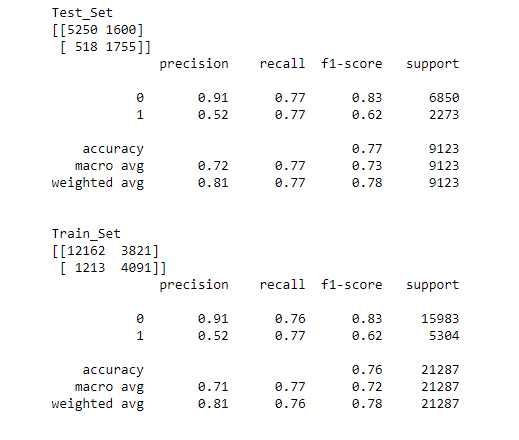

KNN Model

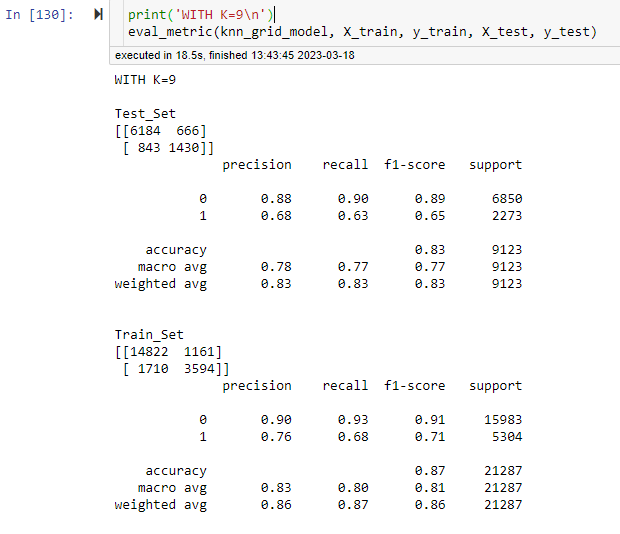

# Final Model and Predict

In [ ]:
X= df.drop(columns="income")
y= df.income

In [ ]:
categorical = ['workclass', 'marital.status', 'occupation', 'relationship', 'race', 'sex', 'native.country', 'education', 'capital_diff']
label_encoder = LabelEncoder()

for feature in categorical:
    X[feature] = label_encoder.fit_transform(X[feature])

y = label_encoder.fit_transform(y)

In [ ]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=9, p=1))]

final_model = Pipeline(steps=operations)

final_model.fit(X, y)

In [ ]:
import pickle

In [ ]:
pickle.dump(final_model, open('knn_final_model', 'wb'))

In [ ]:
loaded_model = pickle.load(open('knn_final_model', 'rb'))

In [ ]:
X.describe().T

In [ ]:
new_obs = {"age": [65, 40],
           "workclass": [1,3],
           "education": [4,5],
           "education.num": [4,9],
           "marital.status": [2,2],
           "occupation": [1, 6],
           "relationship": [1, 0],
           "race": [0, 2],
           "sex": [0, 1],
           "hours.per.week": [25,60],
           "native.country": [0,1],
           "capital_diff": [0.5,1]
          }

In [ ]:
samples = pd.DataFrame(new_obs)
samples

In [ ]:
predictions = loaded_model.predict(samples)
predictions_proba = loaded_model.predict_proba(samples)

In [ ]:
samples["pred"] = predictions
samples["pred_proba_1"] = predictions_proba[:,1]
samples["pred_proba_0"] = predictions_proba[:,0]
samples